## DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

**DBSCAN** es un algoritmo de densidad, muy popular debido a su efectividad para tareas como identificación de clase en un contexto espacial.

Los algoritmos basados en densidad encuentran regiones de alta densidad que separan los datos y crean clusters asimétricos. Puede encontrar clusters de formar arbitrarias sin verse afectado por el ruido.

La idea detrás del **DBSCAN** es que si un punto en particular pertenece a un grupo, debería estar cerca de muchos otros puntos en ese grupo.


- **DBSCAN** puede encontrar clusters de formas arbitrarias. Incluso puede encontrar un cluster completamente rodeado por un grupo diferente. 

- **DBSCAN** tiene una noción de ruido y es robusto para outliers, aunque depende del dataset.

- **DBSCAN** es muy práctico para muchos problemas porque no requiere de especificar el número de clústeres, como en **`K-Means`**.



- Por ser un algoritmo de clustering **DBSCAN** no cuenta con un **`built-in method`** para **"predecir"** o **"clasificar"** nuevas instancias, si quisieramos hacer esto, deberiamos entrenar un modelo de clasificación utilizando como columna objetivo la creada por **DBSCAN**.

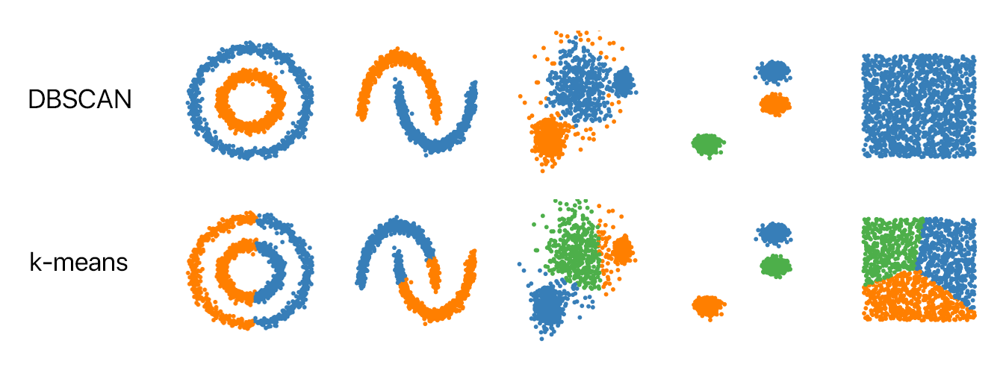

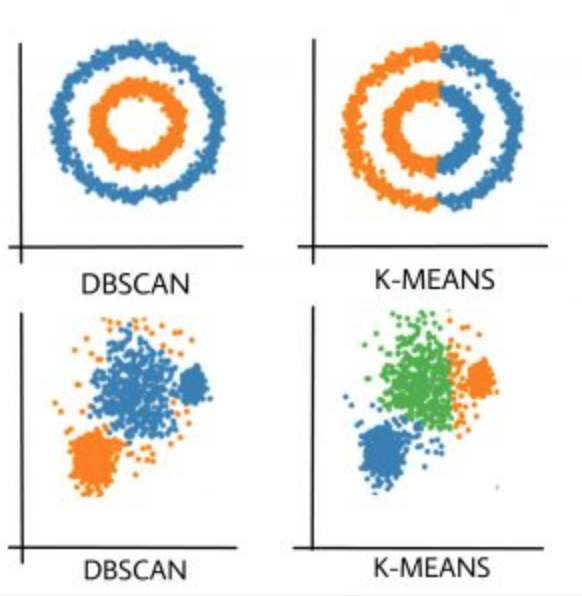

_**Documentacion:** https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html_

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter

from sklearn import datasets

# Normalizacion
from sklearn.preprocessing import MinMaxScaler

In [2]:
iris = datasets.load_iris()
X = iris.data
y = iris.target

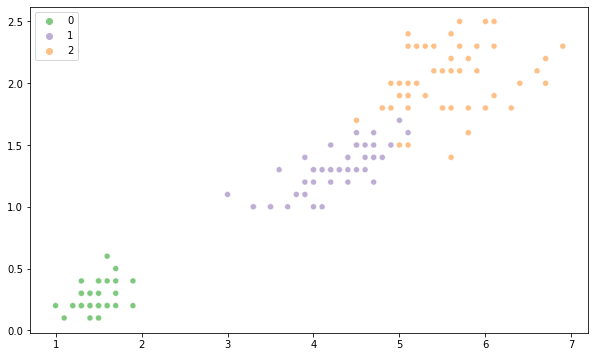

In [3]:
plt.figure(figsize = (10, 6))

# Datos Originales
sns.scatterplot(x = X[:, 2], y = X[:, 3], hue = y, palette = "Accent")
plt.show()

In [4]:
# Normalización de datos

x_scaler = MinMaxScaler()
X = x_scaler.fit_transform(X)

X

array([[0.22222222, 0.625     , 0.06779661, 0.04166667],
       [0.16666667, 0.41666667, 0.06779661, 0.04166667],
       [0.11111111, 0.5       , 0.05084746, 0.04166667],
       [0.08333333, 0.45833333, 0.08474576, 0.04166667],
       [0.19444444, 0.66666667, 0.06779661, 0.04166667],
       [0.30555556, 0.79166667, 0.11864407, 0.125     ],
       [0.08333333, 0.58333333, 0.06779661, 0.08333333],
       [0.19444444, 0.58333333, 0.08474576, 0.04166667],
       [0.02777778, 0.375     , 0.06779661, 0.04166667],
       [0.16666667, 0.45833333, 0.08474576, 0.        ],
       [0.30555556, 0.70833333, 0.08474576, 0.04166667],
       [0.13888889, 0.58333333, 0.10169492, 0.04166667],
       [0.13888889, 0.41666667, 0.06779661, 0.        ],
       [0.        , 0.41666667, 0.01694915, 0.        ],
       [0.41666667, 0.83333333, 0.03389831, 0.04166667],
       [0.38888889, 1.        , 0.08474576, 0.125     ],
       [0.30555556, 0.79166667, 0.05084746, 0.125     ],
       [0.22222222, 0.625     ,

### Clustering

In [5]:
from sklearn.cluster import DBSCAN

In [6]:
dbscan = DBSCAN()
dbscan.fit(X)

DBSCAN()

### Etiquetas

In [7]:
# .labels_ nos retorna la "prediccion" del modelo de clustering
# El número de valores únicos está definido por n_clusters
# DBSCAN puede etiquetar outliers en caso de que los puntos esten muy alejados de la nube de puntos

dbscan.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [8]:
Counter(dbscan.labels_)

Counter({0: 150})

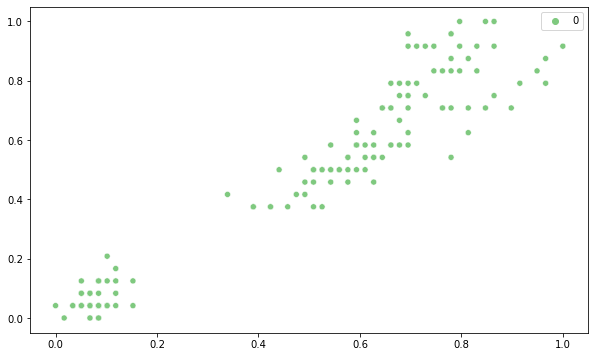

In [9]:
plt.figure(figsize = (10, 6))

# Datos Originales filtrados por DBSCAN
sns.scatterplot(x = X[:, 2], y = X[:, 3], hue = dbscan.labels_, palette = "Accent")
plt.show()


# DBSCAN clasificó todos los elementos en el mismo grupo
# Esto es por el parámetro de "eps" que tiene un valor "muy alto".

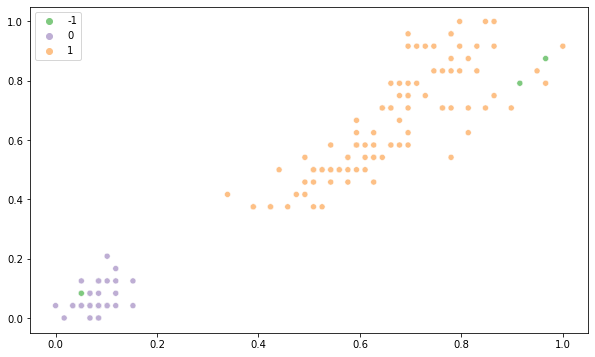

In [10]:
# DBSCAN con eps = 0.2

dbscan = DBSCAN(eps = 0.2)
dbscan.fit(X)

plt.figure(figsize = (10, 6))

# Datos Originales filtrados por DBSCAN
sns.scatterplot(x = X[:, 2], y = X[:, 3], hue = dbscan.labels_, palette = "Accent")
plt.show()

# Ahora los clasifico en 2 nubes de puntos y además clasificó algunos puntos como outliers

In [11]:
Counter(dbscan.labels_)

Counter({0: 49, -1: 3, 1: 98})

### Parámetros del Modelo (Tunning)

#### Parametros de DBSCAN()

- **`eps`**: float, **default** = 0.5
    - La distancia máxima entre dos muestras para que una se considere en la vecindad de la otra.
    - Este es el parámetro más importante para crear adecuadamente los clusters, depende del conjunto de datos y la función de distancia.
___

- **`min_samples`**: int, **default** = 5
    - El número de elementos (o instancias) en una vecindad para que un punto se considere un punto central. Esto incluye el punto en sí.
    - Por lo general, es común ver que este número es **`2*n_atributos`**.    
___

- **`metric`**: str, **default** = "euclidean"
    - La métrica que se usará al calcular la distancia entre instancias en una matriz de características.
    - "cityblock", "cosine", "euclidean", "l1", "l2", "manhattan".
___

- **`algorithm`**: {"auto", "ball_tree", "kd_tree", "brute"}, **default** = "auto"
    - El algoritmo que usará **`NearestNeighbors`** para calcular distancias puntuales y encontrar vecinos más cercanos.
    - "auto" intentará decidir el algoritmo más apropiado en función de los valores de **`X`**.
___

- **`leaf_size`**: int, **`default`** = 30
    - Tamaño de hoja para **`BallTree`** o **`cKDTree`**.
    - Esto puede afectar la velocidad de construcción, así como la memoria requerida para almacenar el árbol.
    - El valor óptimo depende de la naturaleza del problema.

### Elbow method para DBSCAN


El valor para **`eps`** se puede elegir usando un gráfico de **`k-distance`**, trazando la distancia con **`k = min_samples - 1`** vecinos más cercano. Los "mejores" valores de **`eps`** son donde esta gráfica muestra un "codo".

- Si **`eps`** se elige demasiado pequeño, una gran parte de los datos no se agruparán.
- Mientras que para un valor demasiado alto de **`eps`**, los grupos se fusionarán y la mayoría de los objetos estarán en el mismo grupo.

En general, son preferibles los valores pequeños de **`eps`** y, como regla general, solo una pequeña fracción de puntos debe estar dentro de esta distancia entre sí.

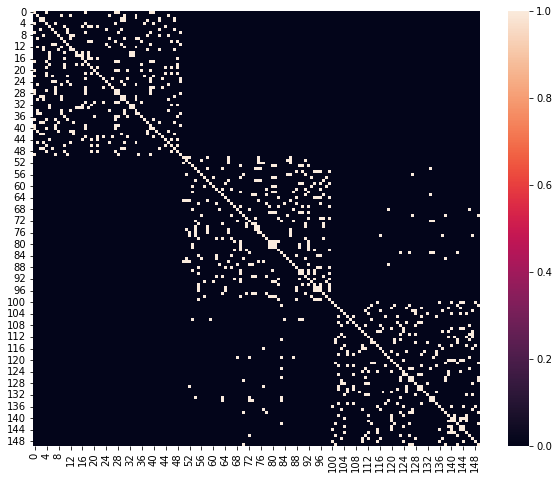

In [12]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors = 2*X.shape[1] - 1)
neigh.fit(X)
distances, indices = neigh.kneighbors(X)

# Plot
plt.figure(figsize = (10, 8))

# Grafico de distancias con k-vecinos más cercanos
sns.heatmap(neigh.kneighbors_graph(X).toarray())

plt.show()

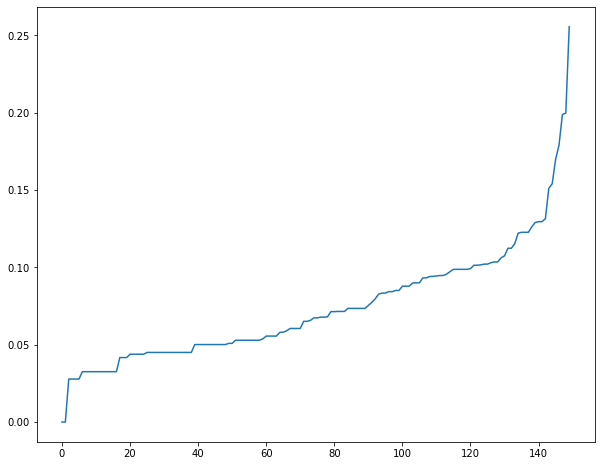

In [13]:
# Plot para encontrar el valor de eps más "optimo"

plt.figure(figsize = (10, 8))

distances = np.sort(distances, axis = 0)[:, 1]

plt.plot(distances)
plt.show()

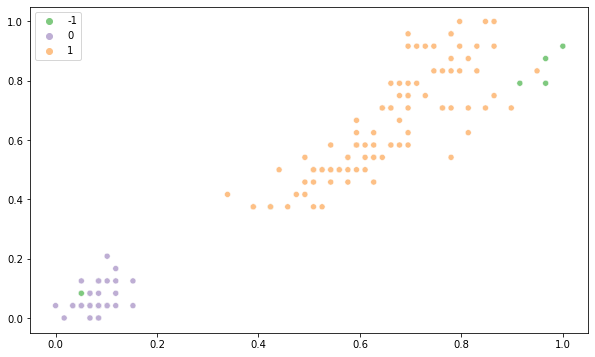

In [14]:
# DBSCAN con eps = 0.20, min_samples = 2*n_atributos

dbscan = DBSCAN(eps = 0.20, min_samples = 2*X.shape[1])
dbscan.fit(X)

plt.figure(figsize = (10, 6))

# Datos Originales filtrados por DBSCAN
sns.scatterplot(x = X[:, 2], y = X[:, 3], hue = dbscan.labels_, palette = "Accent")
plt.show()

# Ahora los clasifico en 2 nubes de puntos y además clasificó algunos puntos como outliers

### Comparación entre K-Means y DBSCAN

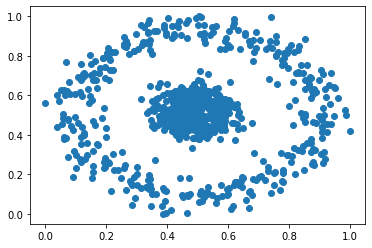

In [17]:
from sklearn.datasets import make_circles

X, y = make_circles(n_samples = 750, factor = 0.2, noise = 0.1, random_state = 42)

scaler = MinMaxScaler()
X = scaler.fit_transform(X)

plt.scatter(X[:, 0], X[:, 1])
plt.show()

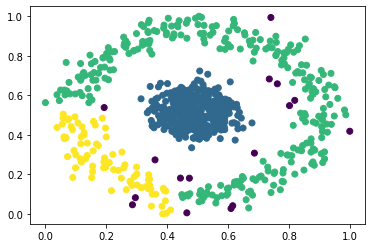

In [18]:
# Usando DBSCAN

dbscan = DBSCAN(eps = 0.05, min_samples = 4)
dbscan.fit(X)

plt.scatter(X[:, 0], X[:, 1], c = dbscan.labels_)
plt.show()

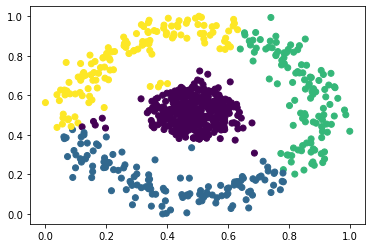

In [25]:
# Usando K-Means

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 4)
kmeans.fit(X)

plt.scatter(X[:, 0], X[:, 1], c = kmeans.labels_)
plt.show()

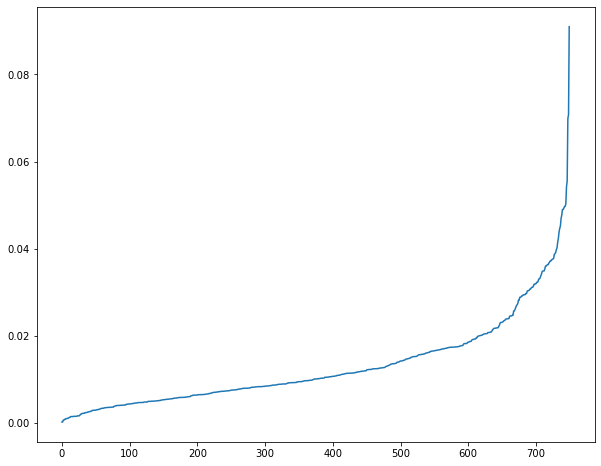

In [20]:
# Metodo del codo para DBSCAN

plt.figure(figsize = (10, 8))

neigh = NearestNeighbors(n_neighbors = 2)
nbrs = neigh.fit(X)

distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis = 0)[:, 1]

plt.plot(distances)
plt.show()

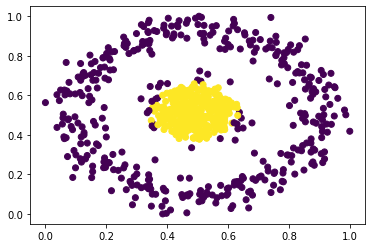

In [21]:
# Usando DBSCAN con eps = 0.03

dbscan = DBSCAN(eps = 0.03, min_samples = 10)
dbscan.fit(X)

plt.scatter(X[:, 0], X[:, 1], c = dbscan.labels_)
plt.show()

In [22]:
Counter(dbscan.labels_)

Counter({0: 347, -1: 403})

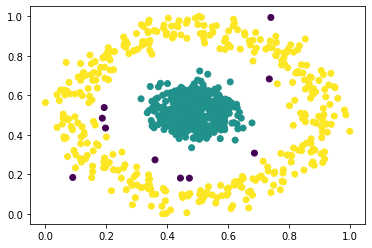

In [23]:
# Usando DBSCAN con eps = 0.07

dbscan = DBSCAN(eps = 0.07, min_samples = 10)
dbscan.fit(X)

plt.scatter(X[:, 0], X[:, 1], c = dbscan.labels_)
plt.show()

In [24]:
Counter(dbscan.labels_)

Counter({0: 375, 1: 365, -1: 10})

### Ejemplo: Market Segmentation

In [26]:
df = pd.read_csv("market_segmetation.csv")

df.drop("Id", axis = 1, inplace = True)

df.head(3)

,Balance,CantidadComprasRealizadas,CompraMasAltaRealizada,CompraMasAltaRealizadaPlazos,FrecuenciadeCompra,FrecuenciadeCompraPlazos,LimiteCredito,Pagos,PagoMinimo,Anualidad
0,40.900749,95.40,0.00,95.4,0.166667,0.083333,1000.0,201.802084,139.509787,12
1,3202.467416,0.00,0.00,0.0,0.000000,0.000000,7000.0,4103.032597,1072.340217,12
2,2495.148862,773.17,773.17,0.0,1.000000,0.000000,7500.0,622.066742,627.284787,12


In [27]:
df.drop_duplicates(inplace = True) 

df.shape

(8636, 10)

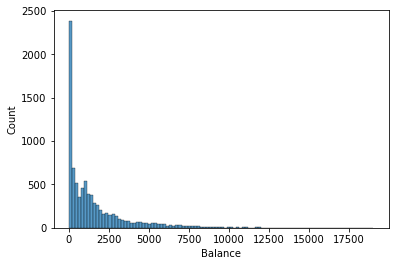

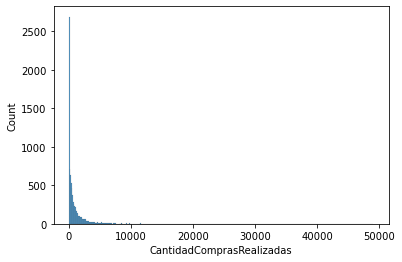

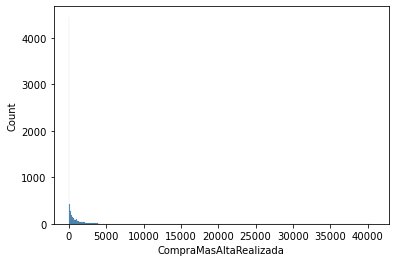

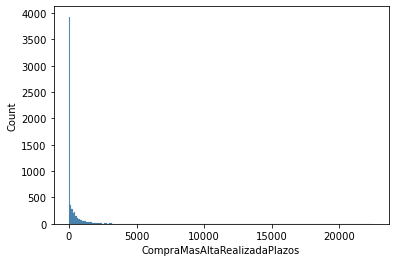

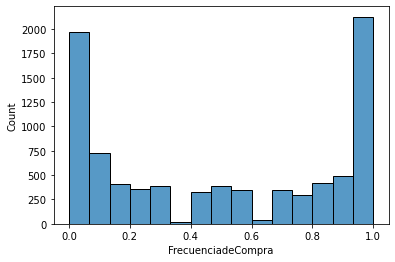

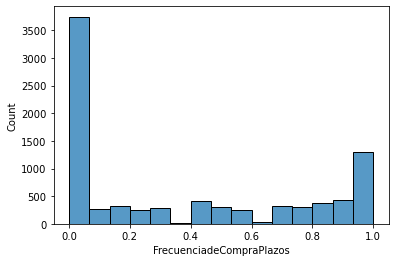

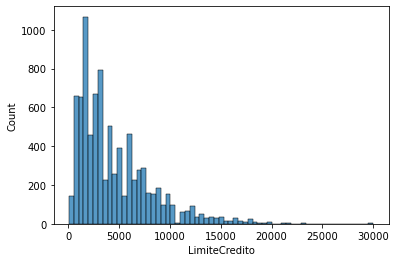

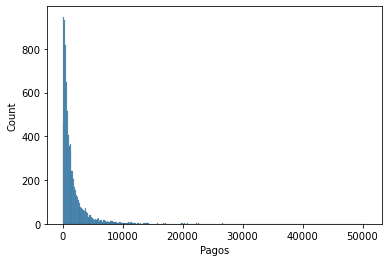

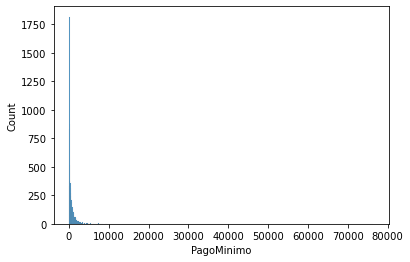

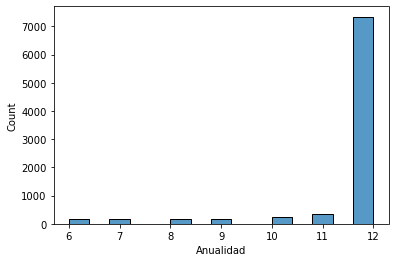

In [28]:
for col in df.columns:
    sns.histplot(x = df[col])
    plt.show()

In [29]:
df = df[df["Balance"] < 6000]
df = df[df["CantidadComprasRealizadas"] <= 3000]
df = df[df["CompraMasAltaRealizada"] < 1500]
df = df[df["CompraMasAltaRealizadaPlazos"] < 1500]
df = df[df["LimiteCredito"] < 20000]
df = df[df["Pagos"] < 8000]
df = df[df["PagoMinimo"] < 3000]

df.drop("Anualidad", axis = 1, inplace = True)

df.shape

(6728, 9)

In [30]:
X = df.values

X.shape

(6728, 9)

### Preprocesamiento

In [31]:
# Normalización de datos

x_scaler = MinMaxScaler()
X = x_scaler.fit_transform(X)

X

array([[0.00681857, 0.03374614, 0.        , ..., 0.04884319, 0.02529729,
        0.04655911],
       [0.53388413, 0.        , 0.        , ..., 0.35732648, 0.51446353,
        0.3579188 ],
       [0.41596688, 0.27349584, 0.51574924, ..., 0.38303342, 0.0779933 ,
        0.20936841],
       ...,
       [0.0039008 , 0.05107906, 0.        , ..., 0.04884319, 0.01018415,
        0.02750317],
       [0.00224351, 0.        , 0.        , ..., 0.02313625, 0.00658291,
        0.01860369],
       [0.06213425, 0.38671874, 0.72926117, ..., 0.05912596, 0.00791396,
        0.02946265]])

### Elbow method para DBSCAN

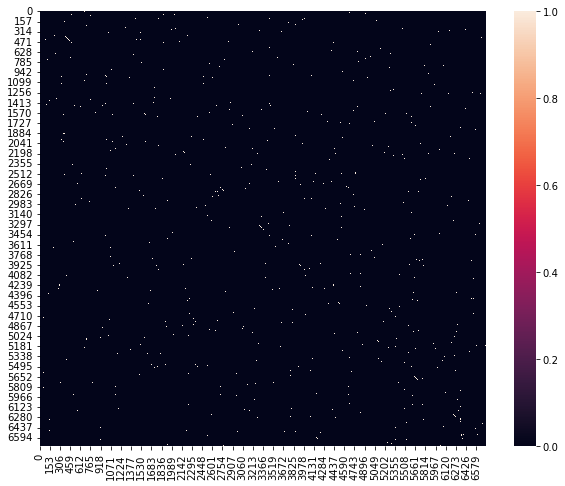

In [32]:
from sklearn.neighbors import NearestNeighbors

neigh = NearestNeighbors(n_neighbors = 2*X.shape[1] - 1)
neigh.fit(X)
distances, indices = neigh.kneighbors(X)

# Plot
plt.figure(figsize = (10, 8))

# Grafico de distancias con k-vecinos más cercanos
sns.heatmap(neigh.kneighbors_graph(X).toarray())

plt.show()

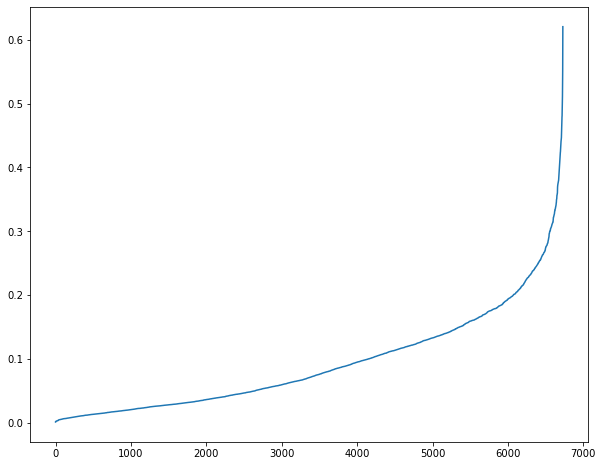

In [33]:
# Plot para encontrar el valor de eps más "optimo"

plt.figure(figsize = (10, 8))

distances = np.sort(distances, axis = 0)[:, 1]

plt.plot(distances)
plt.show()

### Modelo

In [35]:
dbscan = DBSCAN(eps = 0.21, min_samples = 2*X.shape[1])
dbscan.fit(X)

DBSCAN(eps=0.21, min_samples=18)

### Etiquetas

In [36]:
dbscan.labels_

array([ 0,  0, -1, ...,  0,  0,  0], dtype=int64)

In [37]:
Counter(dbscan.labels_)

Counter({0: 5097, -1: 1631})

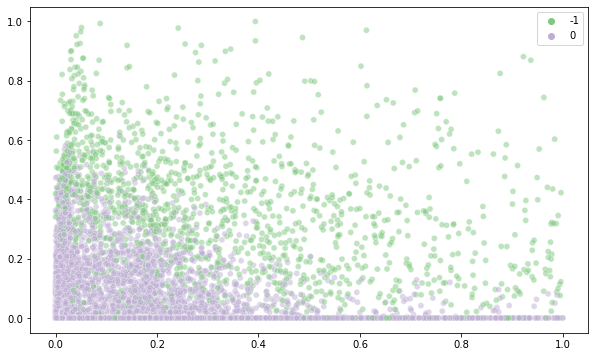

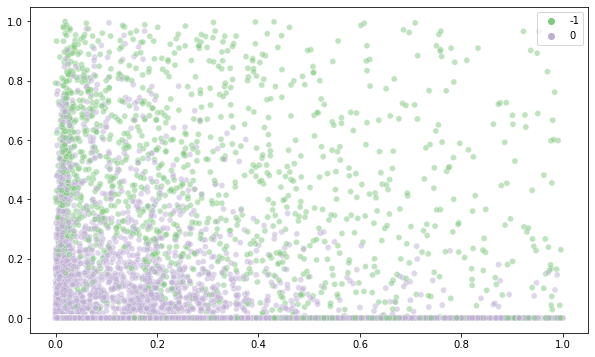

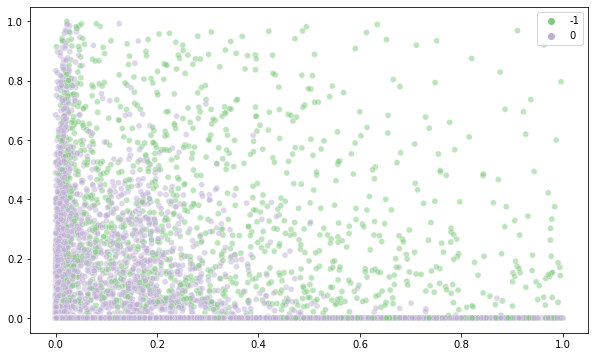

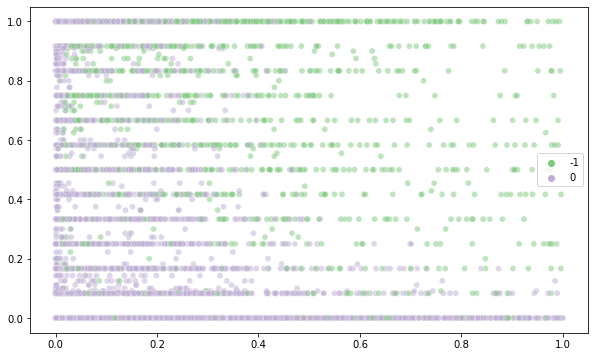

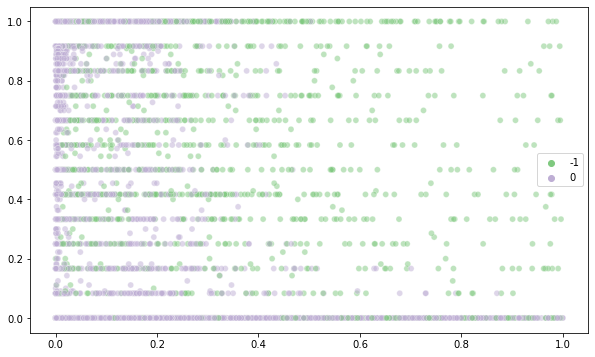

...

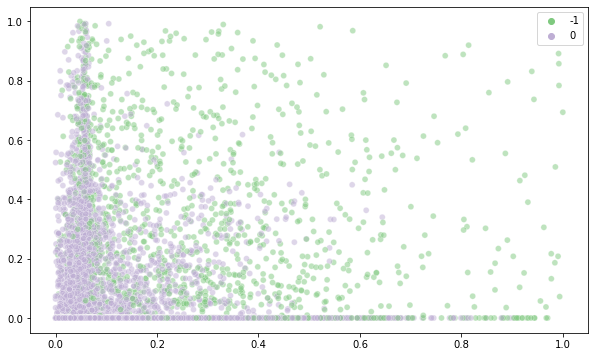

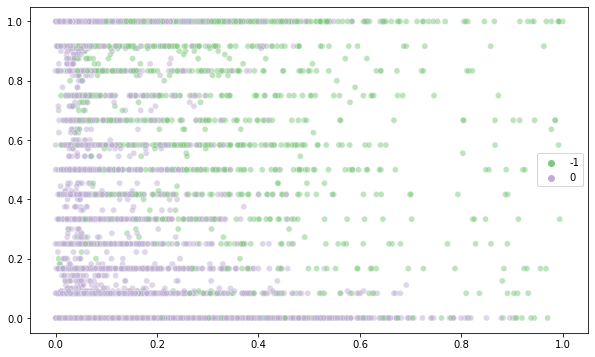

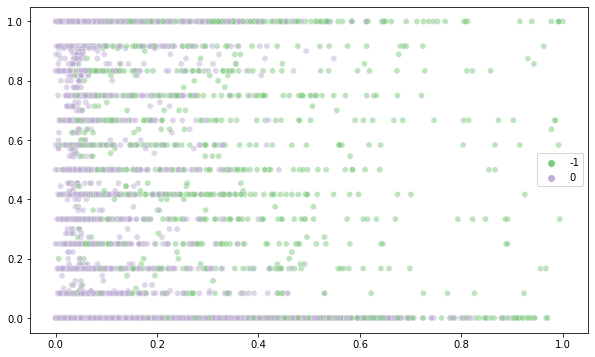

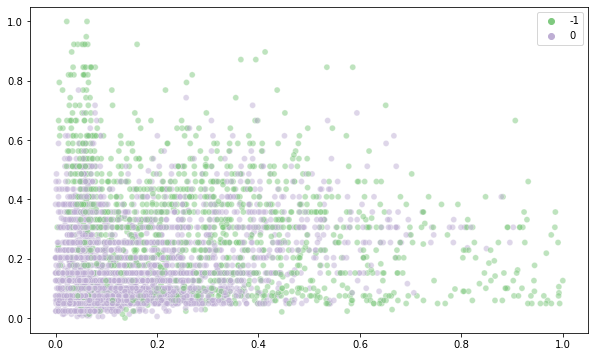

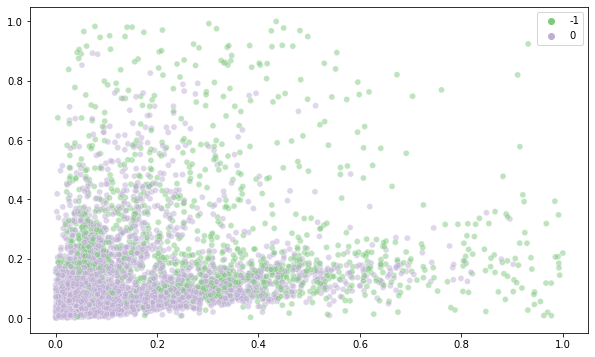

In [38]:
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        if i != j:
            
            plt.figure(figsize = (10, 6))
            # Datos Originales filtrados por DBSCAN
            sns.scatterplot(x = X[:, i], y = X[:, j], hue = dbscan.labels_, palette = "Accent", alpha = 0.5)
            plt.show()

In [ ]:
################################################################################################################################